In [1]:
user = 'elsa'

import numpy as np
import matplotlib.pyplot as plt
from videoreader import VideoReader
import xarray as xr

if user == 'adrian':
    import xarray_behave as xb
    server_root = 'Z:'
elif user == 'elsa':
    import sys
    sys.path.append('/home/local/UG-STUDENT/elsa.steinfath/code/')
    import src.xarray_behave as xb
    server_root = '/home/local/UG-STUDENT/elsa.steinfath/ukme04'

## assembling data

In [2]:
# assemble data

ds = xb.assemble('localhost-20181120_144618',root=f'{server_root}/#Common/chainingmic/')
ds

<xarray.Dataset>
Dimensions:              (bodyparts: 3, coords: 2, event_types: 4, flies: 2, poseparts: 12, sampletime: 6035114, time: 603512)
Coordinates:
  * sampletime           (sampletime) float64 0.0 0.0001 0.0002 ... 603.5 603.5
  * time                 (time) float64 0.0 0.001 0.002 ... 603.5 603.5 603.5
    nearest_frame        (time) uint64 622 623 623 623 ... 60931 60931 60931
  * event_types          (event_types) <U15 'song_pulse_any' ... 'sine'
  * bodyparts            (bodyparts) <U6 'head' 'center' 'tail'
  * coords               (coords) <U1 'y' 'x'
  * poseparts            (poseparts) <U16 'head' 'neck' ... 'right_wing' 'tail'
Dimensions without coordinates: flies
Data variables:
    song                 (sampletime) float32 -0.011 -0.024 ... 0.003 0.004
    song_labels          (time) uint8 0 0 0 0 0 0 0 0 0 0 ... 0 0 0 0 0 0 0 0 0
    song_events          (time, event_types) bool False False ... False False
    body_positions       (time, flies, bodyparts, coords) 

In [3]:
# assemble metrics

dsm = xb.assemble_metrics(ds)
dsm

/home/local/UG-STUDENT/elsa.steinfath/miniconda3/lib/python3.7/site-packages/numpy/lib/function_base.py:1520: RuntimeWarning: invalid value encountered in greater
  _nx.copyto(ddmod, pi, where=(ddmod == -pi) & (dd > 0))
/home/local/UG-STUDENT/elsa.steinfath/miniconda3/lib/python3.7/site-packages/numpy/lib/function_base.py:1522: RuntimeWarning: invalid value encountered in less
  _nx.copyto(ph_correct, 0, where=abs(dd) < discont)
/home/local/UG-STUDENT/elsa.steinfath/miniconda3/lib/python3.7/site-packages/numpy/lib/function_base.py:1520: RuntimeWarning: invalid value encountered in greater
  _nx.copyto(ddmod, pi, where=(ddmod == -pi) & (dd > 0))
/home/local/UG-STUDENT/elsa.steinfath/miniconda3/lib/python3.7/site-packages/numpy/lib/function_base.py:1522: RuntimeWarning: invalid value encountered in less
  _nx.copyto(ph_correct, 0, where=abs(dd) < discont)


<xarray.Dataset>
Dimensions:            (absolute_features: 16, flies: 2, relative_features: 6, relative_flies: 2, time: 603512)
Coordinates:
  * time               (time) float64 0.0 0.001 0.002 ... 603.5 603.5 603.5
  * absolute_features  (absolute_features) <U23 'angles' ... 'wing_angle_sum'
    nearest_frame      (time) uint64 622 623 623 623 ... 60931 60931 60931 60931
  * relative_features  (relative_features) <U25 'distance' ... 'relative_velocity_lateral'
Dimensions without coordinates: flies, relative_flies
Data variables:
    abs_features       (time, flies, absolute_features) float64 -9.394 ... nan
    rel_features       (time, flies, relative_flies, relative_features) float64 nan ... nan

# raw data
It's apparent that due to the interpolation, the raw data are 'jumpy'. Therefore we need to smooth the data with a running moving average (with a window of 100 steps).

In [4]:
# Load video

filename = 'localhost-20181120_144618'
video_end = '.avi'
root = f'{server_root}/#Common/chainingmic/dat'
videoname = f'{root}/{filename}/{filename}{video_end}'
vr = VideoReader(videoname)

Text(0.5, 1.0, 'smoothed with running window of 100 samples')

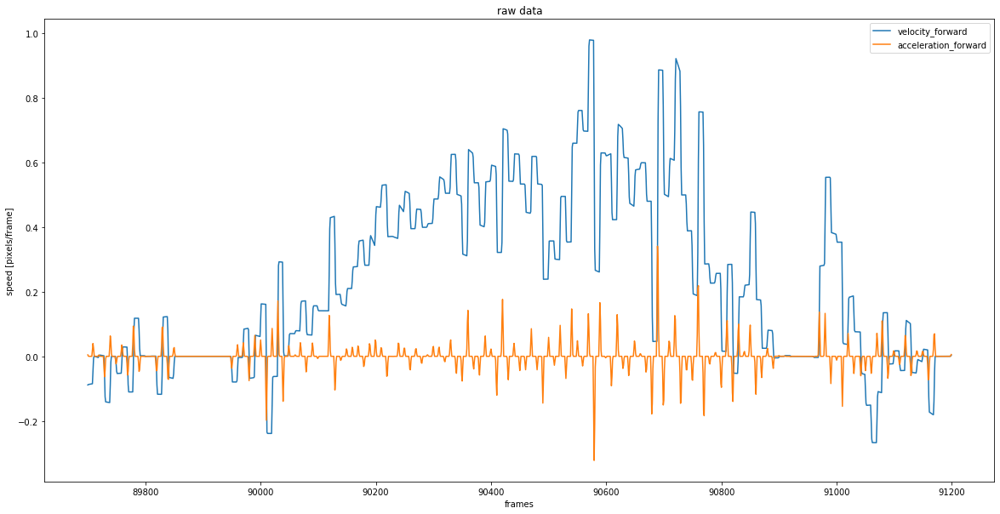

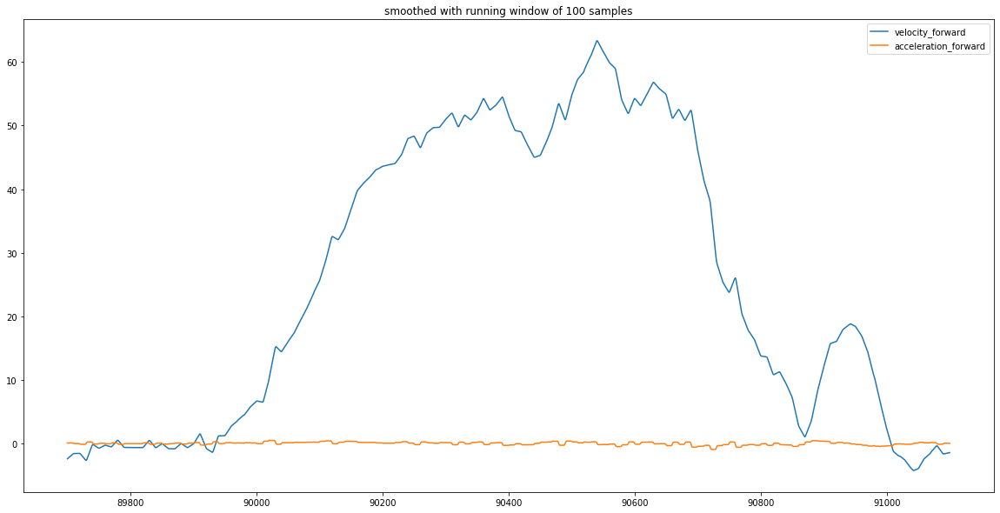

In [16]:
idx_0 = 89700
idx_1 = 91200
indices=[idx_0,idx_1]
idx=idx_0

fly=[0]
other_fly=[1]

# raw data
features = ['velocity_forward', 'acceleration_forward']
fig = plt.figure(figsize=(20,10))
for ifeature in features:
    plt.plot(np.arange(idx_0,idx_1),dsm.abs_features.sel(absolute_features=ifeature).values[idx_0:idx_1,fly],label=ifeature)
plt.title(f'raw data')
plt.ylabel('speed [pixels/frame]')
plt.xlabel('frames')
plt.legend()

# smoothed data
steps=100

fig = plt.figure(figsize=(20,10))
for ifeature in features:
    smoothed = np.convolve(np.squeeze(dsm.abs_features.sel(absolute_features=ifeature).values[idx_0:idx_1,fly]),np.ones(steps,dtype=int),'valid')
    plt.plot(np.arange(idx_0,idx_1-steps+1), smoothed, label=ifeature)
plt.legend()
plt.title(f'smoothed with running window of {steps} samples')
    

## how to access data?

In [15]:
# loading position coordinate (x) of a body part (head)

head_x = ds.pose_positions_allo.sel(poseparts='head',coords='x').values[idx_0:idx_1:steps, fly]    # do we need "[:,0]" ??? it is the same data
head_x

(15,)

## example of velocities for a moving fly

rotational speed, forward velocity and lateral velocity

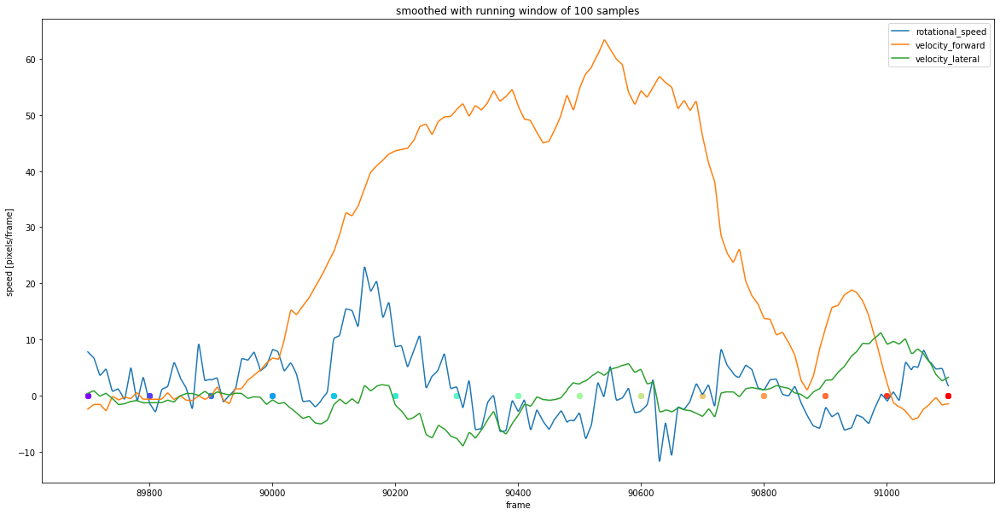

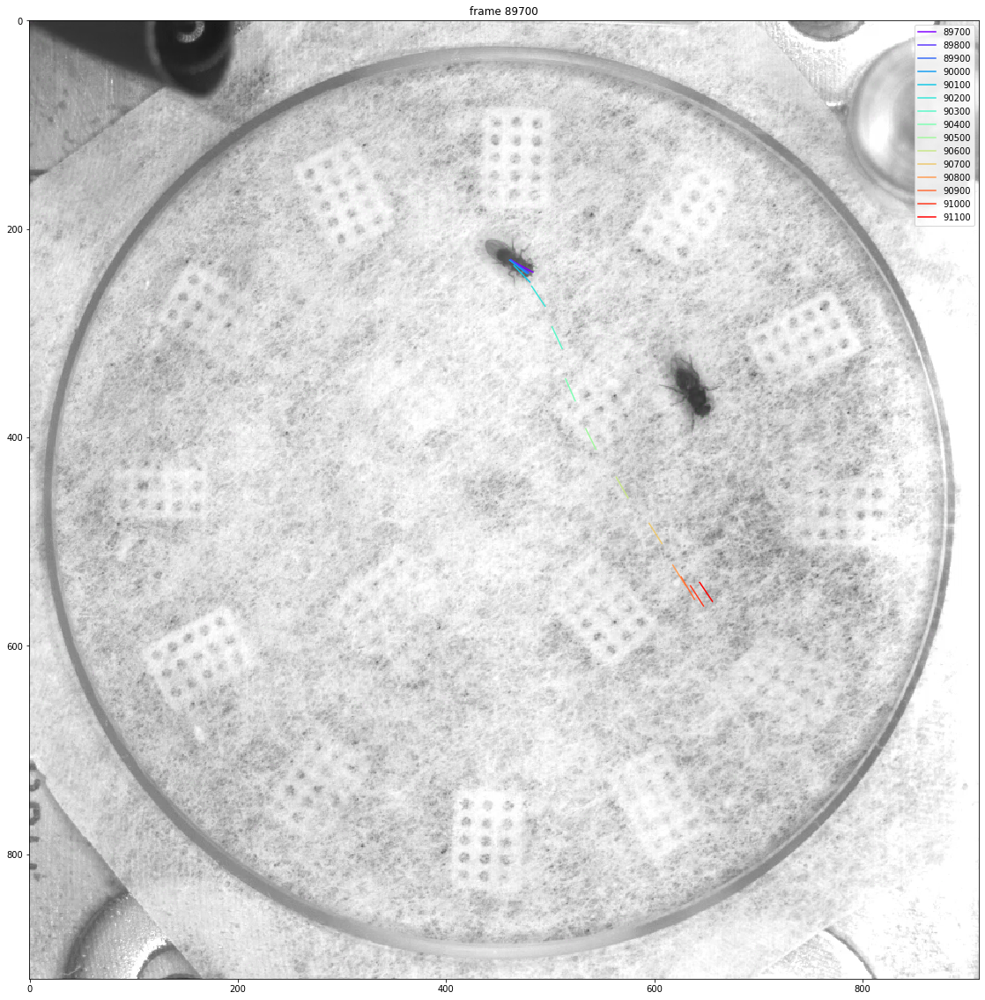

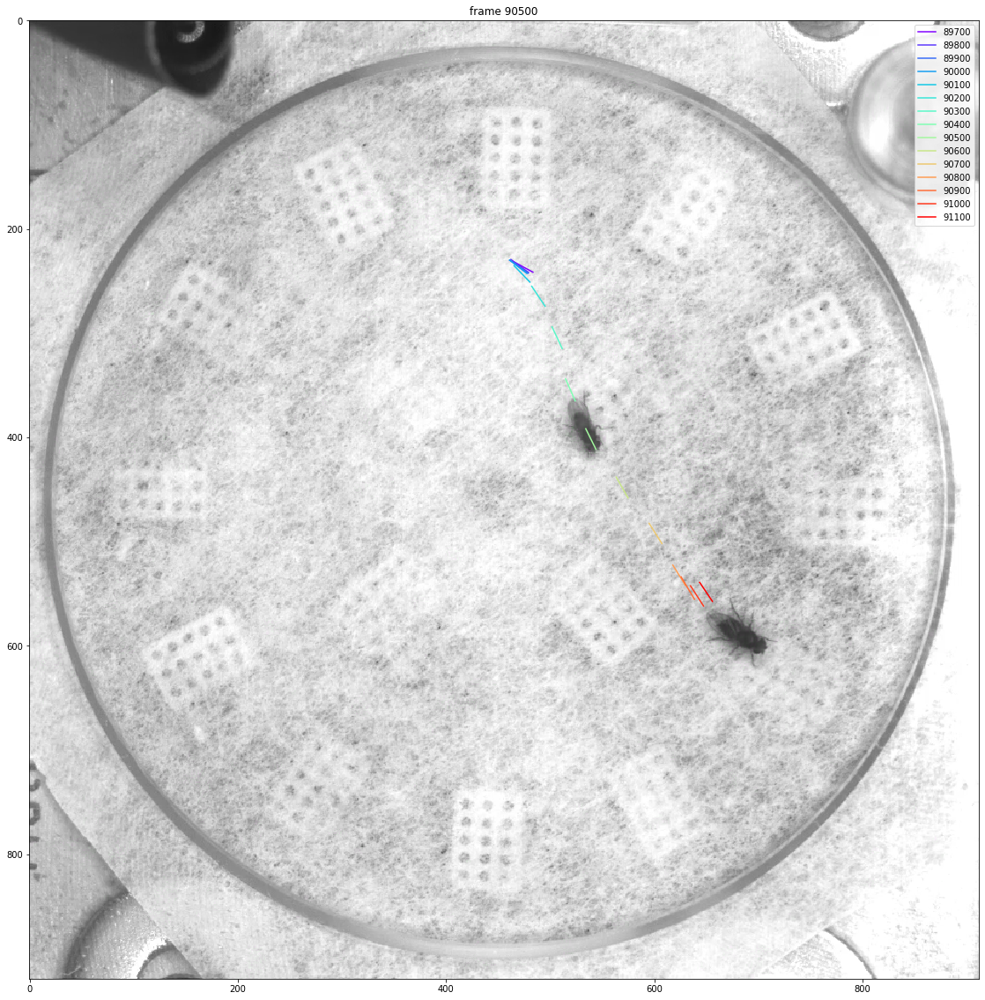

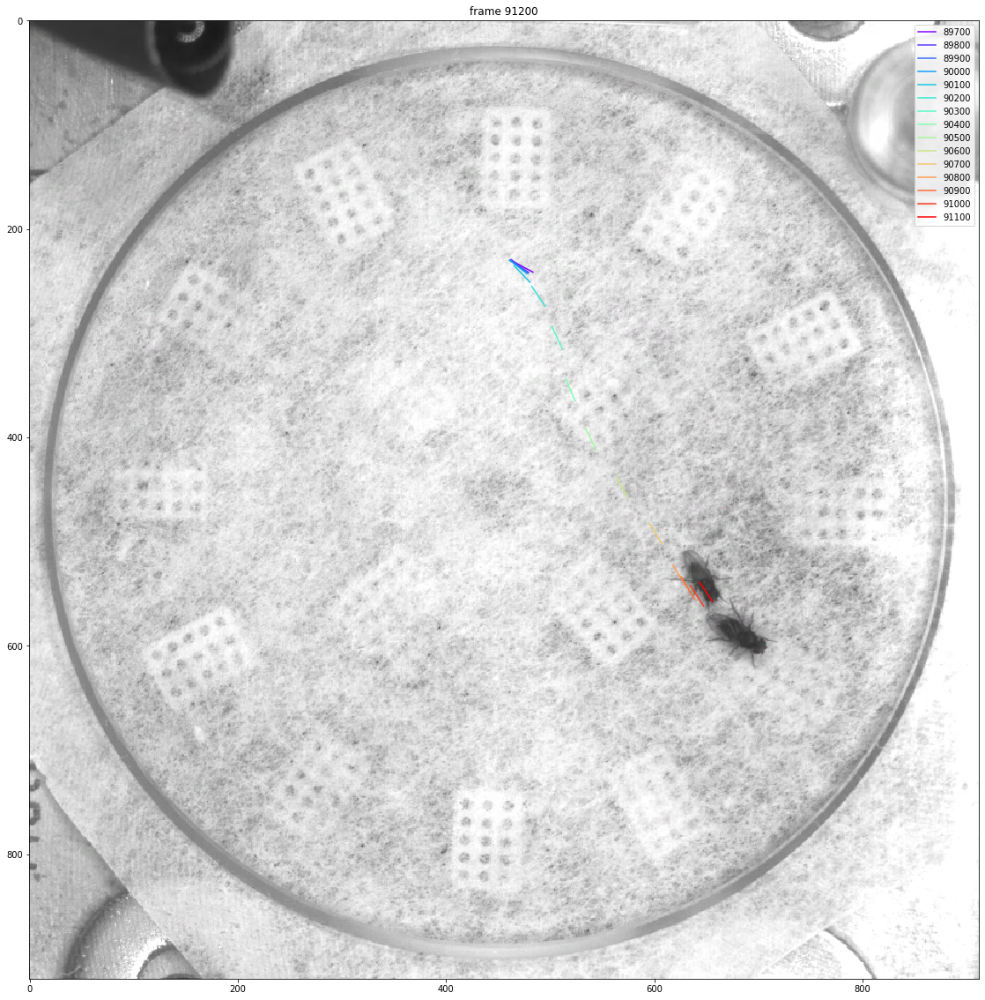

In [7]:
# running window for rotational speed and velocities
steps=100

features = ['rotational_speed', 'velocity_forward', 'velocity_lateral']

fig = plt.figure(figsize=(20,10))
for ifeature in features:
    smoothed = np.convolve(np.squeeze(dsm.abs_features.sel(absolute_features=ifeature).values[idx_0:idx_1,fly]),np.ones(steps,dtype=int),'valid')
    plt.plot(np.arange(idx_0,idx_1-steps+1), smoothed, label=ifeature)
    plt.title(f'smoothed with running window of {steps} samples')
    
    xs=np.arange(idx_0,idx_1,steps)
    colors = plt.cm.rainbow(np.linspace(0, 1, len(xs)))
    for i,c in zip(xs,colors):
        plt.scatter(i,0, color=c)
    
    plt.ylabel('speed [pixels/frame]')
    plt.xlabel('frame')
    plt.legend()
plt.show()

head_x = ds.pose_positions_allo.sel(poseparts='head',coords='x').values[idx_0:idx_1:steps, fly][:,0]
head_y = ds.pose_positions_allo.sel(poseparts='head',coords='y').values[idx_0:idx_1:steps, fly][:,0]
thorax_x = ds.pose_positions_allo.sel(poseparts='thorax',coords='x').values[idx_0:idx_1:steps, fly][:,0]
thorax_y = ds.pose_positions_allo.sel(poseparts='thorax',coords='y').values[idx_0:idx_1:steps, fly][:,0]

# three example frames
example_frames= [idx_0,idx_1-700,idx_1]
for iframe in example_frames:
    fig = plt.figure(figsize=(20,20))
    fn = ds.pose_positions_allo.nearest_frame[iframe]  # get frame number for that idx
    frame = vr[fn]
    plt.imshow(frame, cmap='Greys')

    plt.gca().set_prop_cycle(plt.cycler('color', colors))
    plt.plot((head_x,thorax_x), (head_y,thorax_y))
    plt.legend(xs)
    plt.title(f'frame {iframe}')
    plt.show()

## example of all components and magnitudes for velocities and accelerations
x and y component (relative to chamber), forward and lateral component (relative to fly), and velocity magnitude (speed)

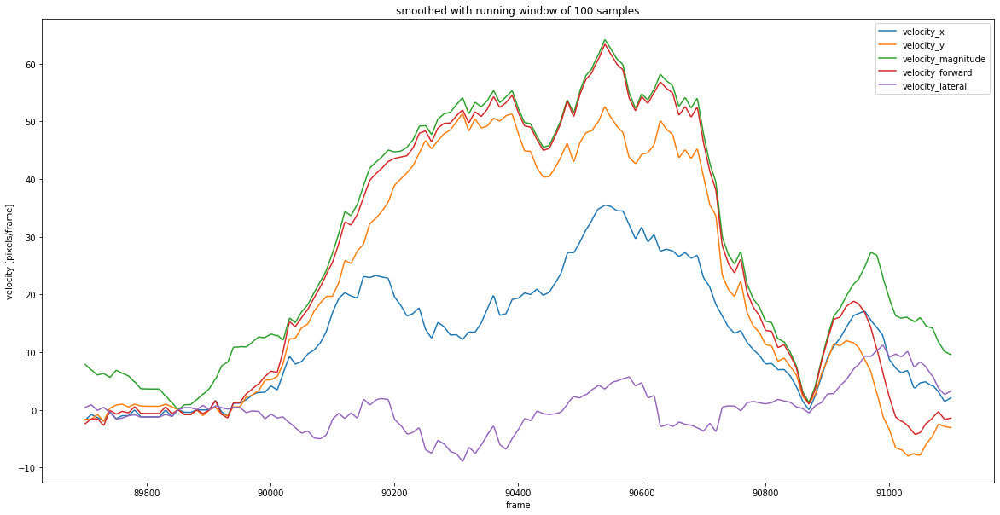

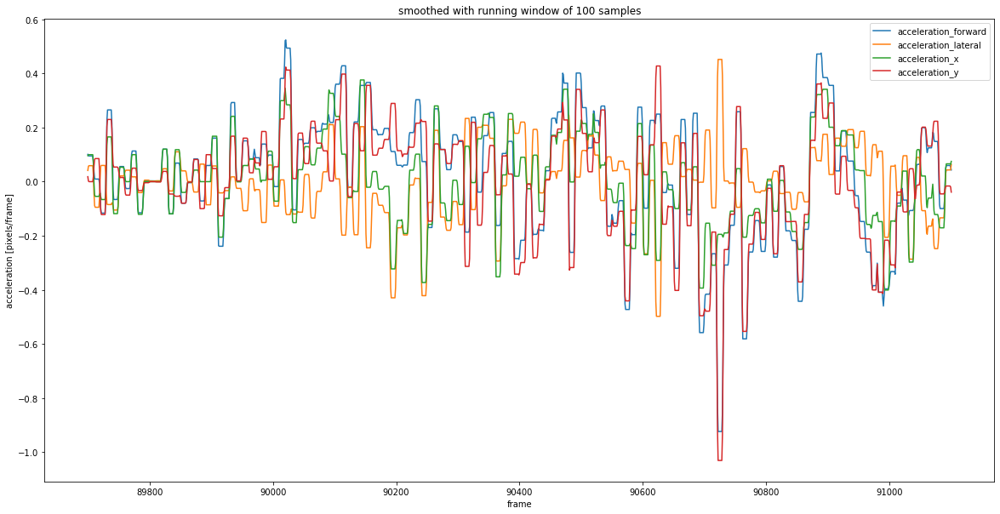

In [9]:
features = ['velocity_x', 'velocity_y','velocity_magnitude', 'velocity_forward', 'velocity_lateral']

fig = plt.figure(figsize=(20,10))
for ifeature in features:
    summed_fv = np.convolve(np.squeeze(dsm.abs_features.sel(absolute_features=ifeature).values[idx_0:idx_1,fly]),np.ones(steps,dtype=int),'valid')
    plt.plot(np.arange(idx_0,idx_1-steps+1),summed_fv,label=ifeature)
    plt.title(f'smoothed with running window of {steps} samples')
    
    plt.ylabel('velocity [pixels/frame]')
    plt.xlabel('frame')
    plt.legend()
plt.show()

features = ['acceleration_forward', 'acceleration_lateral', 'acceleration_x', 'acceleration_y']#'acceleration_mag',#'rotational_speed', 'velocity_forward', 'velocity_lateral']

fig = plt.figure(figsize=(20,10))
for ifeature in features:
    summed_fv = np.convolve(np.squeeze(dsm.abs_features.sel(absolute_features=ifeature).values[idx_0:idx_1,fly]),np.ones(steps,dtype=int),'valid')
    plt.plot(np.arange(idx_0,idx_1-steps+1),summed_fv,label=ifeature)
    plt.title(f'smoothed with running window of {steps} samples')
    
    plt.ylabel('acceleration [pixels/frame]')
    plt.xlabel('frame')
    plt.legend()
plt.show()

## illustration of angle variables
relative orientation: difference between the orientation of the body axes

relative angle: angle at which the thorax of other flies is found relative to the reference fly's orientation

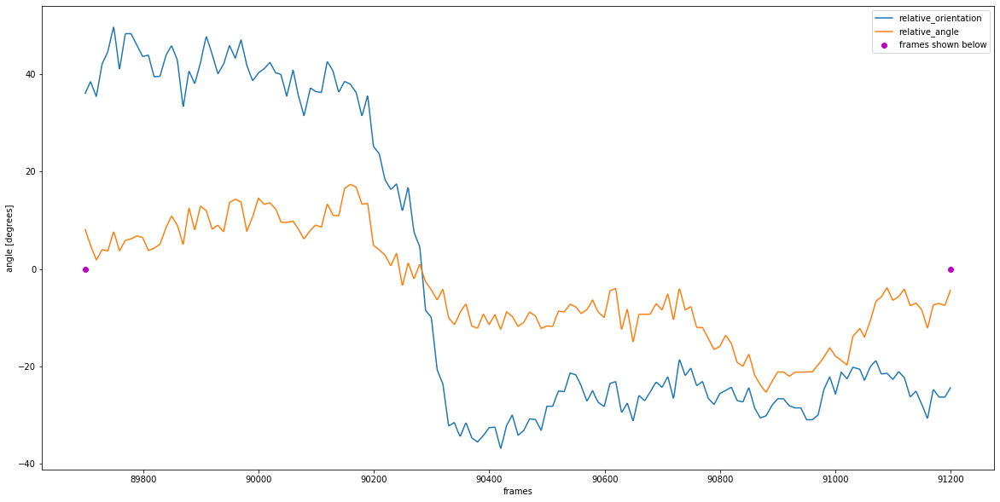

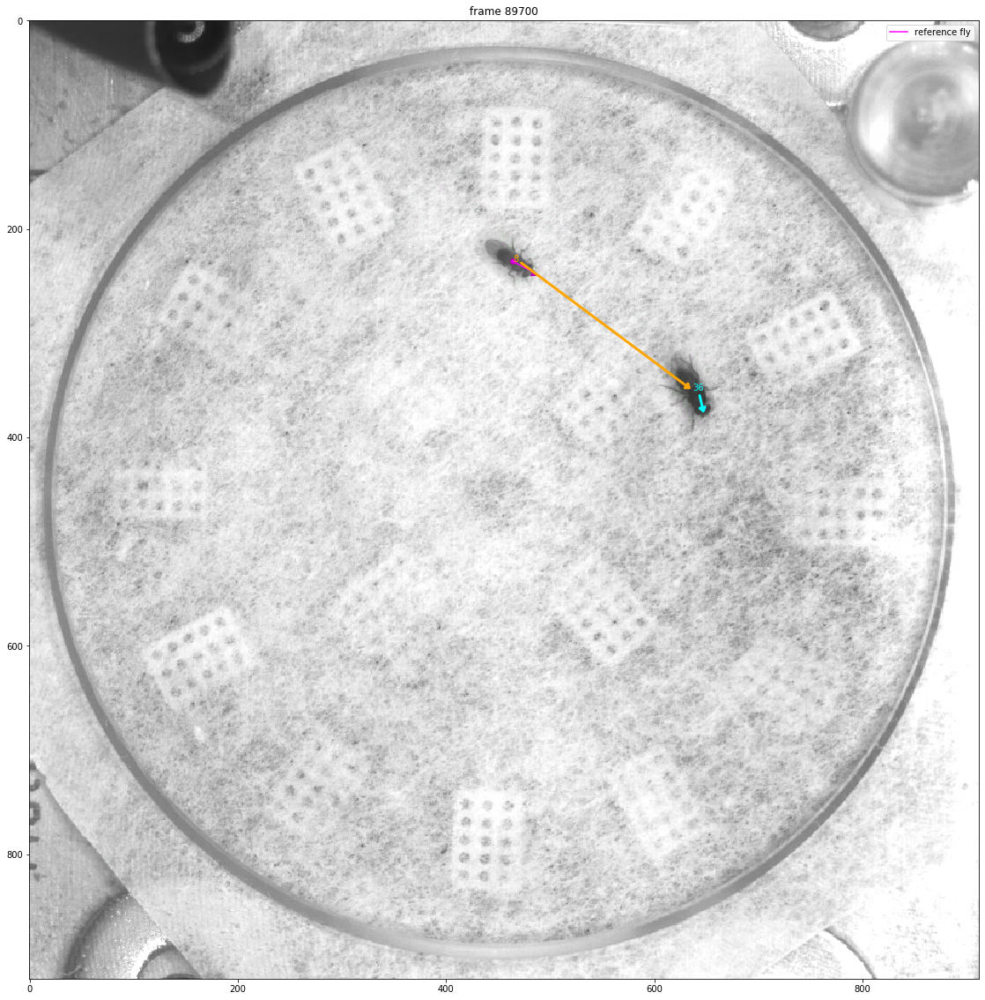

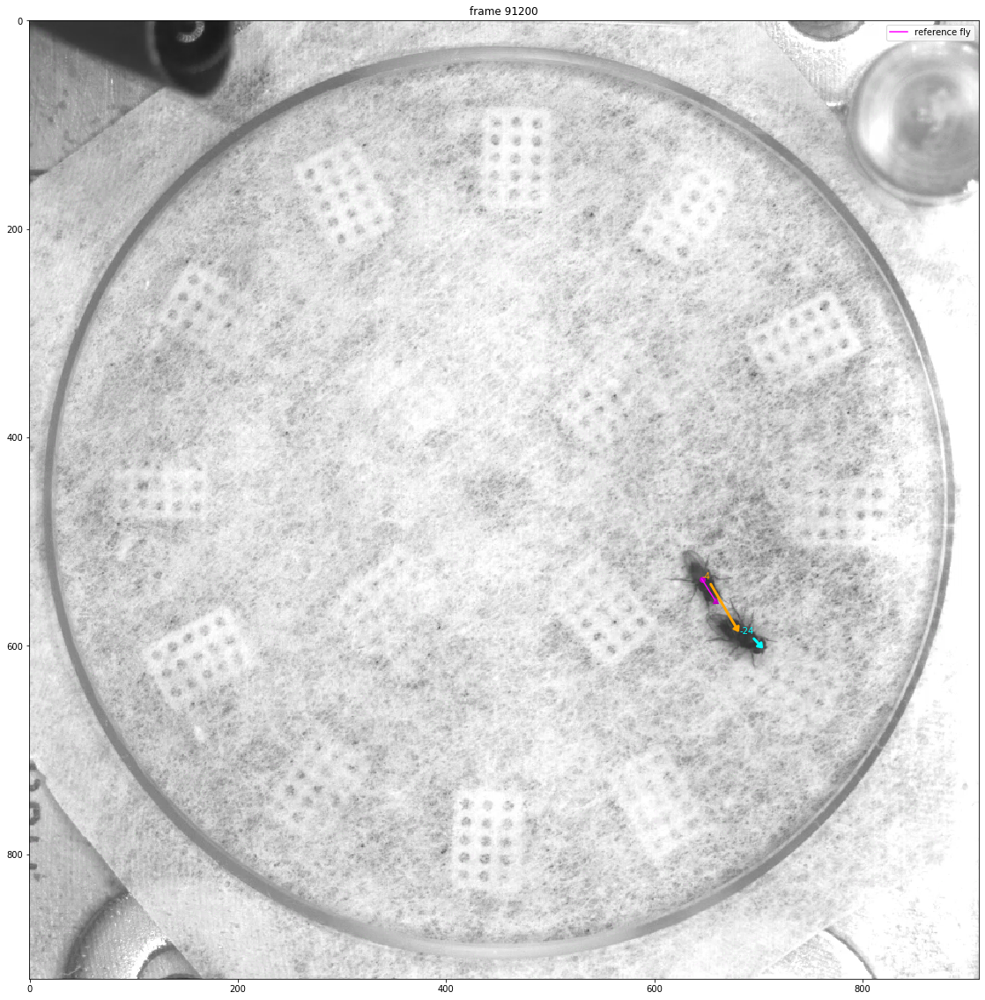

In [20]:
# demo for angles
features = ['relative_orientation', 'relative_angle']

fig = plt.figure(figsize=(20,10))
for ifeature in features:
    plt.plot(np.arange(idx_0,idx_1),dsm.rel_features.sel(relative_features=ifeature).values[idx_0:idx_1,fly,other_fly],label=ifeature)
plt.ylabel('angle [degrees]')
plt.xlabel('frames')
plt.plot(indices,[0,0],'mo',label='frames shown below')
plt.legend()
plt.show()


for idx in indices:
    
    head_x = ds.pose_positions_allo.sel(poseparts='head',coords='x').values[idx, fly][0]
    head_y = ds.pose_positions_allo.sel(poseparts='head',coords='y').values[idx, fly][0]
    thorax_x = ds.pose_positions_allo.sel(poseparts='thorax',coords='x').values[idx, fly][0]
    thorax_y = ds.pose_positions_allo.sel(poseparts='thorax',coords='y').values[idx, fly][0]

    other_x = ds.pose_positions_allo.sel(poseparts='thorax',coords='x').values[idx, other_fly][0]
    other_y = ds.pose_positions_allo.sel(poseparts='thorax',coords='y').values[idx, other_fly][0]
    other_head_x = ds.pose_positions_allo.sel(poseparts='head',coords='x').values[idx, other_fly][0]
    other_head_y = ds.pose_positions_allo.sel(poseparts='head',coords='y').values[idx, other_fly][0]
    
    fig = plt.figure(figsize=(20,20))
    fn = ds.pose_positions_allo.nearest_frame[idx]  # get frame number for that idx
    frame = vr[fn]

    plt.imshow(frame, cmap='Greys')
    plt.gca().set_aspect('equal')

    # reference fly
    plt.plot(thorax_x,thorax_y,'mo')
    plt.plot(head_x,head_y,'m^')
    plt.plot((head_x,thorax_x), (head_y,thorax_y),color='magenta',label='reference fly')

    # the relative angle of the reference fly is the angle of the reference fly relative to the angle between both flies
    rel_angle = int(dsm.rel_features.sel(relative_features='relative_angle').values[idx,fly,other_fly])
    plt.annotate(f'{rel_angle}',xy=(other_x, other_y), xytext=(thorax_x, thorax_y), arrowprops=dict(arrowstyle="-|>, head_width=0.3",color='orange',lw=3),color='orange')

    # the orientation of the other fly is the other flies angle relative to the angle of the reference fly
    rel_orientation = int(dsm.rel_features.sel(relative_features='relative_orientation').values[idx,fly,other_fly])
    plt.annotate(f'{rel_orientation}',xy=(other_head_x, other_head_y), xytext=(other_x, other_y), arrowprops=dict(arrowstyle="-|>, head_width=0.3",color='cyan',lw=3),color='cyan')

    plt.legend()
    plt.title(f'frame {idx}')
    plt.show()

## application in video with many flies
show relative orientation, distance and relative angle. Yellow x marks the reference fly.

In [11]:
def plot_frame_text(vr, dataset, time, nflies, data_text, ref_fly, data_text_name):
    frame_number = np.unique(dataset.nearest_frame.sel(time=time).data)
    frame = vr[frame_number]
    vtime = dataset.time[dataset.nearest_frame == frame_number][0].values
    
    plt.imshow(frame, cmap='Greys')
    plt.plot(dataset.pose_positions_allo.loc[vtime, :, :, 'x'], dataset.pose_positions_allo.loc[vtime, :, :, 'y'], '.')
    for ifly in range(nflies):
        if ifly != ref_fly:
            plt.text(dataset.pose_positions_allo.loc[vtime, ifly, 'thorax', 'x']+30, dataset.pose_positions_allo.loc[vtime, ifly, 'thorax', 'y']-5, f"{data_text.loc[vtime,ref_fly,ifly].values.astype(np.int)}", color='red', fontsize=15)
    plt.scatter(dataset.pose_positions_allo.loc[vtime, ref_fly, 'thorax', 'x'], dataset.pose_positions_allo.loc[vtime, ref_fly, 'thorax', 'y'], marker='X', s=400, c='yellow')
    plt.xlim(0, frame.shape[1])
    plt.title(f"{data_text_name}", fontsize=15)
    plt.axis('off')

In [12]:
# assembling data

datename = 'localhost-20190703_164840'
expsetup = 'backlight'
root = f'{server_root}/#Common/{expsetup}'

dataset = xb.assemble(datename, root=root)
metrics_dataset = xb.assemble_metrics(dataset)

# loading specific metrics

rel_orientations = metrics_dataset.rel_features.sel(relative_features='relative_orientation')
dist = metrics_dataset.rel_features.sel(relative_features='distance')
rel_angle = metrics_dataset.rel_features.sel(relative_features='relative_angle')

# loading video object

video_path = f'{server_root}/#Common/{expsetup}/dat/{datename}/{datename}.mp4'
print(f'   loading video object from {video_path}')
vr_bl = VideoReader(video_path)

/home/local/UG-STUDENT/elsa.steinfath/miniconda3/lib/python3.7/site-packages/numpy/lib/function_base.py:1520: RuntimeWarning: invalid value encountered in greater
  _nx.copyto(ddmod, pi, where=(ddmod == -pi) & (dd > 0))
/home/local/UG-STUDENT/elsa.steinfath/miniconda3/lib/python3.7/site-packages/numpy/lib/function_base.py:1522: RuntimeWarning: invalid value encountered in less
  _nx.copyto(ph_correct, 0, where=abs(dd) < discont)
/home/local/UG-STUDENT/elsa.steinfath/miniconda3/lib/python3.7/site-packages/numpy/lib/function_base.py:1520: RuntimeWarning: invalid value encountered in greater
  _nx.copyto(ddmod, pi, where=(ddmod == -pi) & (dd > 0))
/home/local/UG-STUDENT/elsa.steinfath/miniconda3/lib/python3.7/site-packages/numpy/lib/function_base.py:1522: RuntimeWarning: invalid value encountered in less
  _nx.copyto(ph_correct, 0, where=abs(dd) < discont)


   loading video object from /home/local/UG-STUDENT/elsa.steinfath/ukme04/#Common/backlight/dat/localhost-20190703_164840/localhost-20190703_164840.mp4


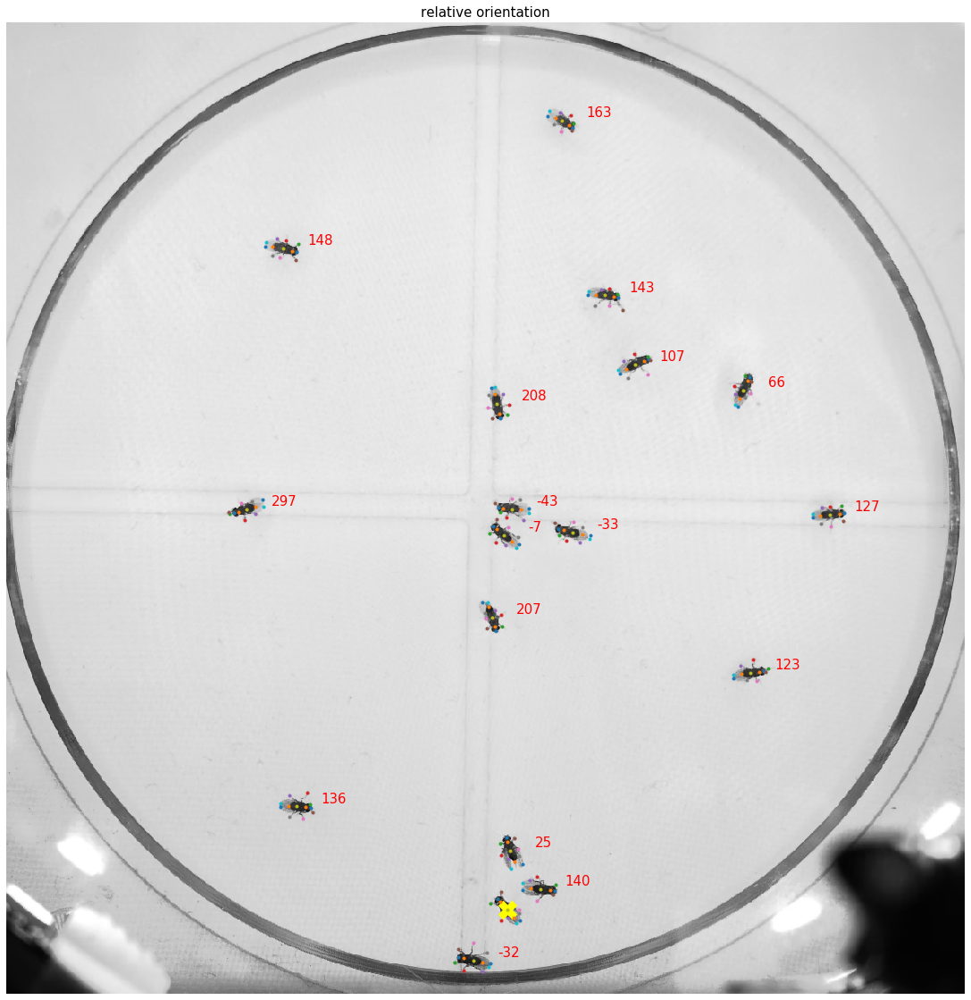

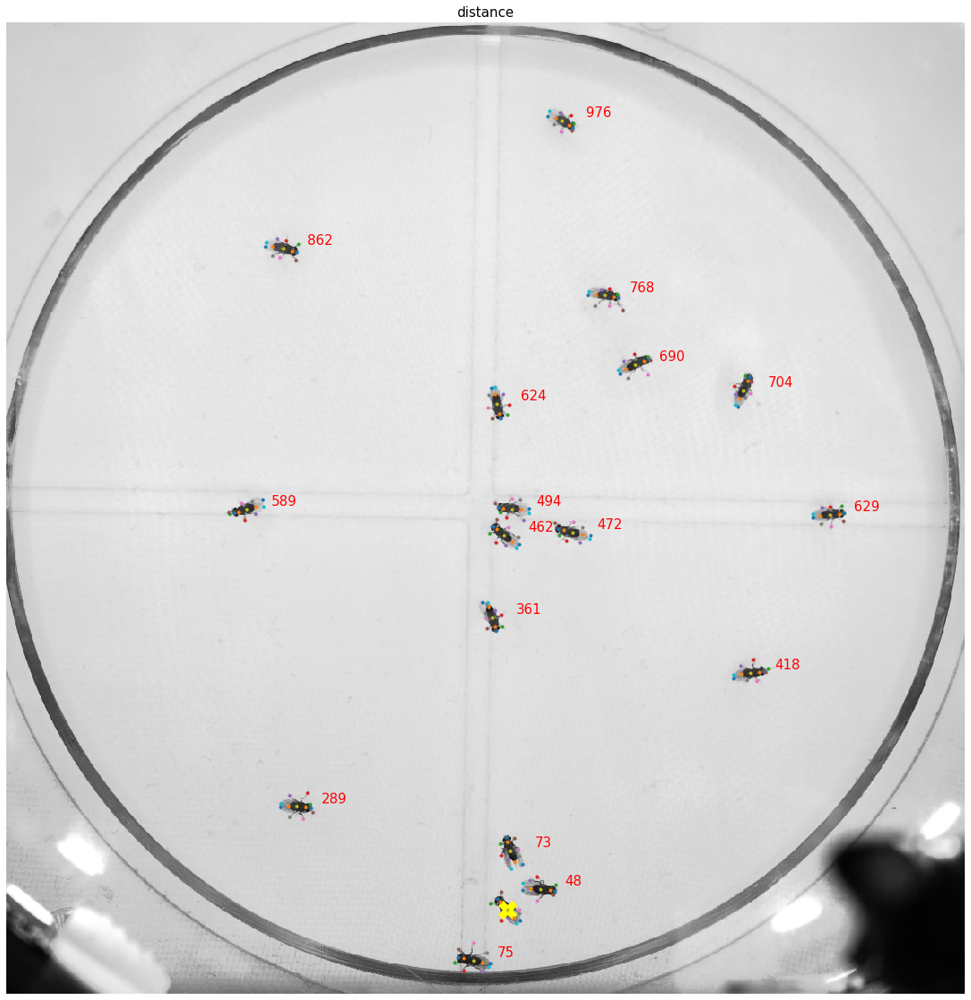

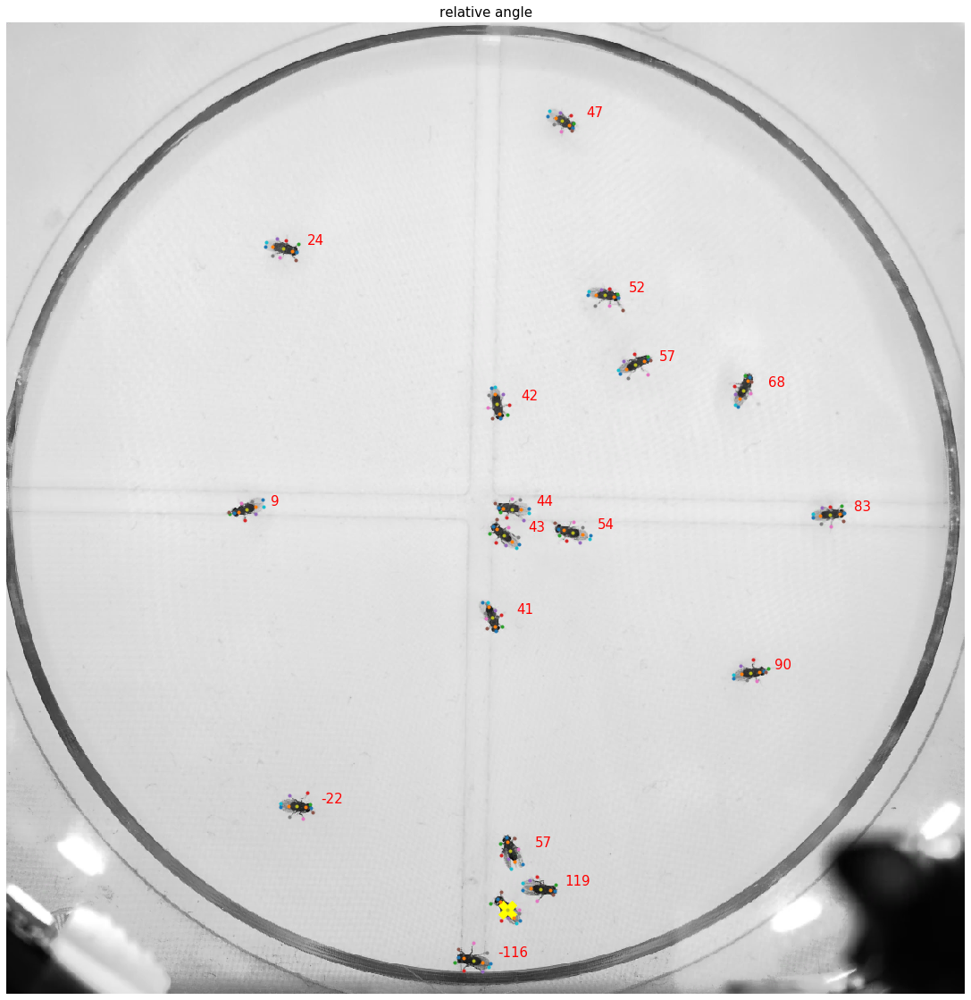

In [13]:
time = 18
frame_number = np.unique(dataset.nearest_frame.sel(time=time).data)
vtime = dataset.time[dataset.nearest_frame == frame_number][0].values

plt.figure(figsize=[20,20])
plot_frame_text(vr_bl, dataset, time, rel_orientations.shape[1], rel_orientations, ref_fly=0, data_text_name='relative orientation')
plt.show()

plt.figure(figsize=[20,20])
plot_frame_text(vr_bl, dataset, time, rel_orientations.shape[1], dist, ref_fly=0, data_text_name='distance')
plt.show()

plt.figure(figsize=[20,20])
plot_frame_text(vr_bl, dataset, time, rel_orientations.shape[1], rel_angle, ref_fly=0, data_text_name='relative angle')
plt.show()